In [ ]:
!pip install rasterio tqdm
!pip install --upgrade 'git+https://github.com/azavea/nasa-hyperspectral.git@feature/mif-decorrelation#egg=hyperspectral&subdirectory=src/hyperspectral'

In [ ]:
from functools import reduce

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio as rio
import torch
import torch.nn
import torch.nn.functional as f

from hyperspectral.decorrelation import imf, mif_torch, mif_decorrelate
from hyperspectral.spectra import SpectralLibrary, Spectrum

In [ ]:
from google.colab import drive

drive.mount("~/data")

Mounted at /root/data


In [ ]:
def ecosis_row_to_spectrum(r, type_, class_):
    data = list(map(lambda kv: (int(kv[0]), kv[1]), filter(lambda kv: kv[0][0] in '0123456789', r.items())))
    metadata = {k:v for k,v in r.items() if k[0] not in '0123456789'}
    xs = list(map(lambda kv: kv[0], data))
    ys = list(map(lambda kv: kv[1], data))
    if 'wavelengths' in metadata.keys():
        metadata['X Units'] = metadata['wavelengths']
    if 'column_units' in metadata.keys():
        metadata['Y Units'] = metadata['column_units']
    return Spectrum(metadata['description'], type_, class_, min(xs), max(xs), len(xs), metadata, xs, ys)

In [ ]:
marine = pd.read_csv('/root/data/MyDrive/Hyperspectral/ECOSIS/spectral-reflectance-of-dry-and-wet-marine-harvested-microplastics-from-kamilo-point--pacific-ocean.csv')
mean_plastic = ecosis_row_to_spectrum(marine.iloc[4], 'manmade', 'plastic')

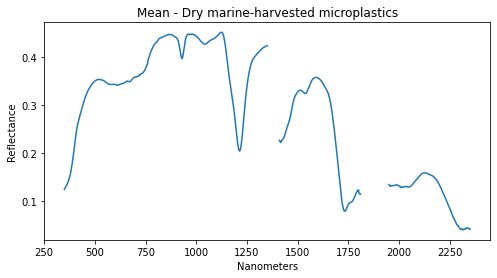

In [ ]:
_, ax = plt.subplots(figsize=(8,4))
mean_plastic.plot(ax=ax)

In [ ]:
with rio.open('/root/data/MyDrive/AVIRIS/f190812t01p00r07_rfl_v1l1/f190812t01p00r07_corr_v1l1_img') as ds:
    print(ds.indexes)
    band_freqs = sorted([ (int(kv[0].split('_')[1]), float(kv[1].split(' ')[0])) for kv in ds.tags().items() if any(num in kv[0] for num in '0123456789')])

(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 22

In [ ]:
reference_spectra = SpectralLibrary([mean_plastic])
reference_spectra.regularize([bf[1] for bf in band_freqs], source_bands=[bf[0] for bf in band_freqs])

In [ ]:
to_drop = reference_spectra.invalid_bands()
to_drop.update([0, 1, 104, 112, 113, 146]) # Manually exlude other problematic bands
reference_spectra.drop_bands(to_drop)

In [ ]:
w = rio.windows.Window(col_off=147, row_off=9116, width=212, height=148)
with rio.open('/root/data/MyDrive/AVIRIS/f190812t01p00r07_rfl_v1l1/f190812t01p00r07_corr_v1l1_img') as ds:
    img = ds.read(reference_spectra.source_bands, window=w)
img.shape

(180, 148, 212)

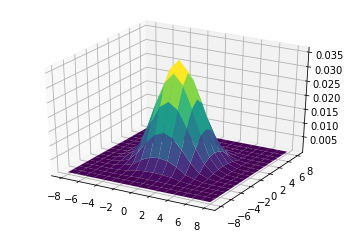

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  
from hyperspectral.decorrelation.mif import spherical_radius, get_mask_2d

k = spherical_radius(img[0,:,:], 1.6)
kernel = get_mask_2d(k)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x = y = np.arange(-k, k+1, 1)
X, Y = np.meshgrid(x, y)
ax.plot_surface(X, Y, kernel,cmap='viridis')

In [ ]:
device = torch.device("cuda")

## Visualize IMFs

In [ ]:
img_tensor = torch.from_numpy(np.array([img[28,:,:]]))
#base = torch.unsqueeze(img_tensor, 0)
base = torch.unsqueeze(img_tensor, 0)
imfs, r = mif_torch(device, img[28,:,:], max_imfs=10)

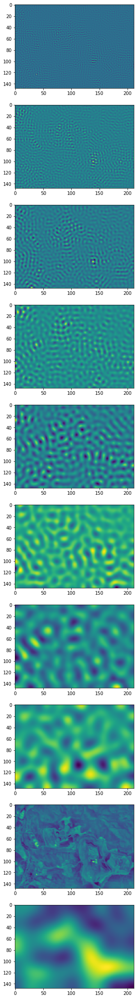

In [ ]:
_, axs = plt.subplots(len(imfs)+2, figsize=(10,40))
for i in range(len(imfs)):
    axs[i].imshow(imfs[i].detach().cpu().numpy()[0,0,:,:])
axs[-2].imshow(reduce(lambda a, b: a + b, imfs).detach().cpu().numpy()[0,0,:,:])
axs[-1].imshow(r.detach().cpu().numpy()[0,0,:,:])

## MIF decorrelation



### Initial generation

Takes a long time.  Only do this once.

In [ ]:
decorrelated = mif_decorrelate(img, dev=device)

In [ ]:
with rio.open('/root/data/MyDrive/Hyperspectral/decorrelated.tif', 
              mode='w', 
              driver='GTiff', 
              width=decorrelated.shape[2], 
              height=decorrelated.shape[1], 
              count=decorrelated.shape[0],
              dtype=decorrelated.dtype) as ds:
  ds.write(decorrelated)

/usr/local/lib/python3.7/dist-packages/rasterio/__init__.py:223: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  **kwargs)


### Load precomputed result

In [ ]:
with rio.open('/root/data/MyDrive/Hyperspectral/decorrelated.tif') as ds:
  decorrelated = ds.read()

/usr/local/lib/python3.7/dist-packages/rasterio/__init__.py:207: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


## Use decorrelated results

In [ ]:
def cos_transform(x, s):
  xs = np.einsum('irc,i->rc', x, s)
  xx = np.einsum('irc,irc->rc', x, x)
  ss = np.dot(s, s)
  return (xs/xx) / ss

In [ ]:
plastic_adjusted = np.array([reference_spectra.spectra[0].y[i] - np.mean(img[i]) for i in range(img.shape[0])])

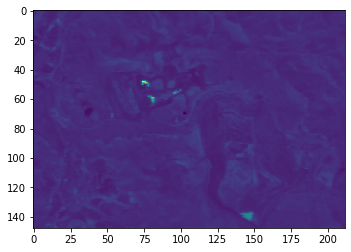

In [ ]:
plt.imshow(cos_transform(decorrelated, plastic_adjusted))

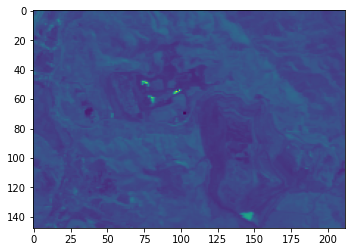

In [ ]:
plt.imshow(cos_transform(img,reference_spectra.spectra[0].y))